In [2]:
"""
1. Plot 5 sample images for visualization
2. Get CLOOME embeddings of molecules and images - UMAP and t-SNE, color all molecules in say red, and all images in blue
3. Save all embeddings of molecules in a fil 
4. Get retrieval results and also plot similarity matrix
5. Use molecules from validatino set to generate images using the decoder
6. plot and save a figure of chemicals, ground truth images, and generated images
"""

print()

In [3]:
import warnings
warnings.filterwarnings("ignore")
import sys
import os

src_path = os.path.split(os.getcwd())[0]
sys.path.insert(0, src_path)

import json
import logging
import numpy as np
import pandas as pd
from pathlib import Path, PurePath
from collections import OrderedDict
from itertools import chain

import torch
from torch.utils.data import DataLoader

import clip.clip as clip
from training.datasets import CellPainting, CellPainting2
from clip.clip import _transform
from clip.model import convert_weights, CLIPGeneral
from tqdm import tqdm

from rdkit.Chem import AllChem
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import DataStructs

from sklearn.metrics import accuracy_score, top_k_accuracy_score

from huggingface_hub import hf_hub_download

### Retrieval

In [4]:
model = "RN50"
image_resolution = [520, 696]
img_path = "../data"
mol_path = "../data/mhn_fingerprints.hdf5"
cloome_bio_path = "../checkpoints/cloome/cloome-bioactivity.pt"
cloome_retrieval_path = "../checkpoints/cloome/cloome-retrieval-zero-shot.pt"
cloome_retrieval_path_mhn = "../checkpoints/cloome/checkpoint_mhn_fps.pt"
train_path = "../data/train_df.pkl"
val_path = "../data/val_df.pkl"
test_path = "../data/test_df.pkl"
model_config_path = "../data/RN502.json"

In [5]:
def convert_models_to_fp32(model):
    for p in model.parameters():
        p.data = p.data.float()
        if p.grad:
            p.grad.data = p.grad.data.float()

In [6]:
preprocess_val = _transform(image_resolution, image_resolution, is_train=False, normalize="dataset", preprocess="crop")

In [7]:
def load(model_path, model_config_file, device, model, image_resolution):
    checkpoint = torch.load(model_path)
    state_dict = checkpoint["state_dict"]

    print('Loading model from', model_config_file)
    assert os.path.exists(model_config_file)
    with open(model_config_file, 'r') as f:
        model_info = json.load(f)
    model = CLIPGeneral(**model_info)

    if str(device) == "cpu":
        model.float()
    print(device)

    new_state_dict = {k[len('module.'):]: v for k,v in state_dict.items()}

    model.load_state_dict(new_state_dict)
    model.to(device)
    model.eval()

    return model, _transform(image_resolution, image_resolution,  is_train=False)

In [62]:
def get_features(dataset, model, device):
    all_image_features = []
    all_image_features_normed = []
    all_text_features = []
    all_text_features_normed = []
    truth_images = []
    all_smiles = []

    print(f"get_features {device}")
    print(len(dataset))

    with torch.no_grad():
        for batch in tqdm(DataLoader(dataset, batch_size=64, pin_memory=False)):
            images, mols = batch["image"], batch["molecule_fp"]
            truth_images.append(images)
            all_smiles.extend(batch["smiles"])

            img_features = model.encode_image(images.to(device))
            text_features = model.encode_text(mols.to(device))

            img_features_normed = img_features / img_features.norm(dim=-1, keepdim=True)
            text_features_normed = text_features / text_features.norm(dim=-1, keepdim=True)

            all_image_features.append(img_features)
            all_image_features_normed.append(img_features_normed)
            all_text_features.append(text_features)
            all_text_features_normed.append(text_features_normed)

    return {
        "all_image_features": torch.cat(all_image_features),
        "all_image_features_normed": torch.cat(all_image_features_normed),
        "all_smiles": all_smiles,
        "all_truth_images": torch.cat(truth_images),
        "all_text_features": torch.cat(all_text_features),
        "all_text_features_normed": torch.cat(all_text_features_normed)
    }

In [63]:
def main(df, model_path, config_path, model, image_resolution):
    # Load the model
    device = "cuda:2" if torch.cuda.is_available() else "cpu"
    print(torch.cuda.device_count())

    model, preprocess = load(model_path, config_path, device, model, image_resolution)

    preprocess_train = _transform(image_resolution, image_resolution, is_train=True)
    preprocess_val = _transform(image_resolution, image_resolution, is_train=False, normalize="dataset", preprocess="crop")

    # Load the dataset
    val = CellPainting2(df,
                       img_path,
                       transforms = preprocess_val)

    # Calculate the image features
    print("getting_features")
    # val_img_features, val_text_features, val_ids = get_features(val, model, device)
    features = get_features(val, model, device)
    
    # return val_img_features, val_text_features, val_ids
    return features

In [64]:
def get_metrics(image_features, text_features):
    metrics = {}
    logits_per_image = image_features @ text_features.t()
    logits_per_text = logits_per_image.t()

    logits = {"image_to_text": logits_per_image, "text_to_image": logits_per_text}
    ground_truth = (
        torch.arange(len(text_features)).view(-1, 1).to(logits_per_image.device)
    )

    rankings = {}
    all_top_samples = {}
    all_preds = {}

    for name, logit in logits.items():
        ranking = torch.argsort(logit, descending=True)
        rankings[name] = ranking
        preds = torch.where(ranking == ground_truth)[1]
        preds = preds.detach().cpu().numpy()
        all_preds[name] = preds
        top_samples = np.where(preds < 10)[0]
        all_top_samples[name] = top_samples
        metrics[f"{name}_mean_rank"] = preds.mean() + 1
        metrics[f"{name}_median_rank"] = np.floor(np.median(preds)) + 1
        for k in [1, 5, 10]:
            metrics[f"{name}_R@{k}"] = np.mean(preds < k)

    return rankings, all_top_samples, all_preds, metrics, logits

In [65]:
features = main(df=val_path,
                                                    model_path=cloome_retrieval_path_mhn, 
                                                    config_path=model_config_path, 
                                                    model=model,
                                                    image_resolution=image_resolution)

8
Loading model from ../data/RN502.json
cuda:2
getting_features
get_features cuda:2
200


100%|██████████| 4/4 [00:15<00:00,  3.93s/it]


In [66]:
img_features_normed = features["all_image_features_normed"]
text_features_normed = features["all_text_features_normed"]
img_features = features["all_image_features"]
text_features = features["all_text_features"]
truth_images = features["all_truth_images"]
all_smiles = features["all_smiles"]


img_features_normed.size(), text_features_normed.size()

(torch.Size([200, 512]), torch.Size([200, 512]))

In [67]:
rankings, all_top_samples, all_preds, metrics, logits = get_metrics(img_features_normed, text_features_normed)

In [68]:
metrics

{'image_to_text_mean_rank': 3.12,
 'image_to_text_median_rank': 2.0,
 'image_to_text_R@1': 0.395,
 'image_to_text_R@5': 0.865,
 'image_to_text_R@10': 0.96,
 'text_to_image_mean_rank': 3.04,
 'text_to_image_median_rank': 2.0,
 'text_to_image_R@1': 0.425,
 'text_to_image_R@5': 0.845,
 'text_to_image_R@10': 0.965}

In [69]:
logits["text_to_image"]

tensor([[ 0.6246,  0.6219,  0.2957,  ...,  0.0074,  0.0386, -0.0197],
        [ 0.4661,  0.7128,  0.4894,  ...,  0.2600,  0.3216,  0.2499],
        [ 0.0738,  0.5662,  0.7490,  ...,  0.0765,  0.0360,  0.0744],
        ...,
        [ 0.0462,  0.2602,  0.2304,  ...,  0.8647,  0.8454,  0.8482],
        [ 0.0610,  0.2790,  0.2319,  ...,  0.8522,  0.8449,  0.8357],
        [ 0.0495,  0.2749,  0.2456,  ...,  0.8228,  0.8219,  0.8264]],
       device='cuda:2')

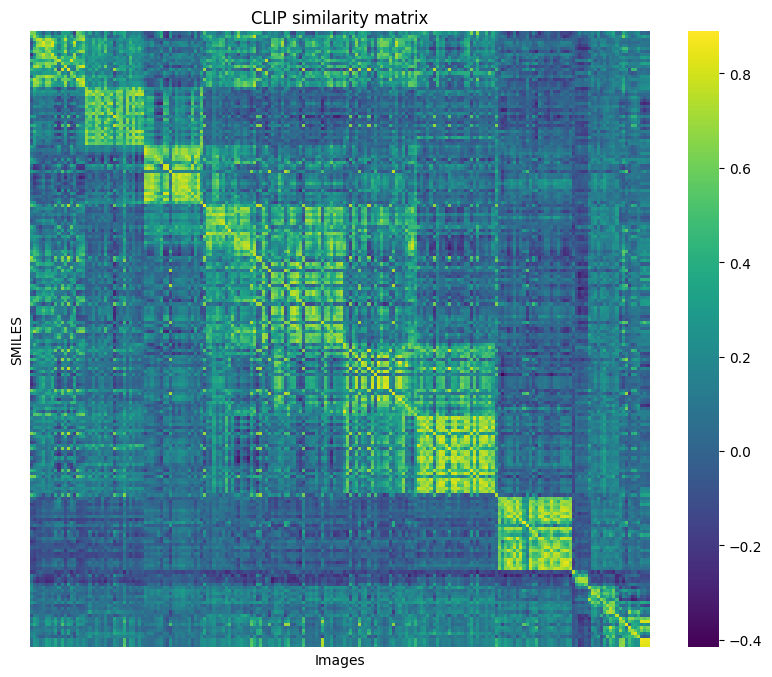

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming logits["text_to_image"] is a PyTorch tensor, convert it to a NumPy array
text_to_image_matrix = logits["text_to_image"].cpu().numpy()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(text_to_image_matrix, cmap='viridis', cbar=True)
plt.title('CLIP similarity matrix')
plt.xlabel('Images')
plt.ylabel('SMILES')

# Hide x and y ticks
plt.xticks([])
plt.yticks([])

plt.savefig("clip_sim_matrix.png", dpi=300)
plt.show()

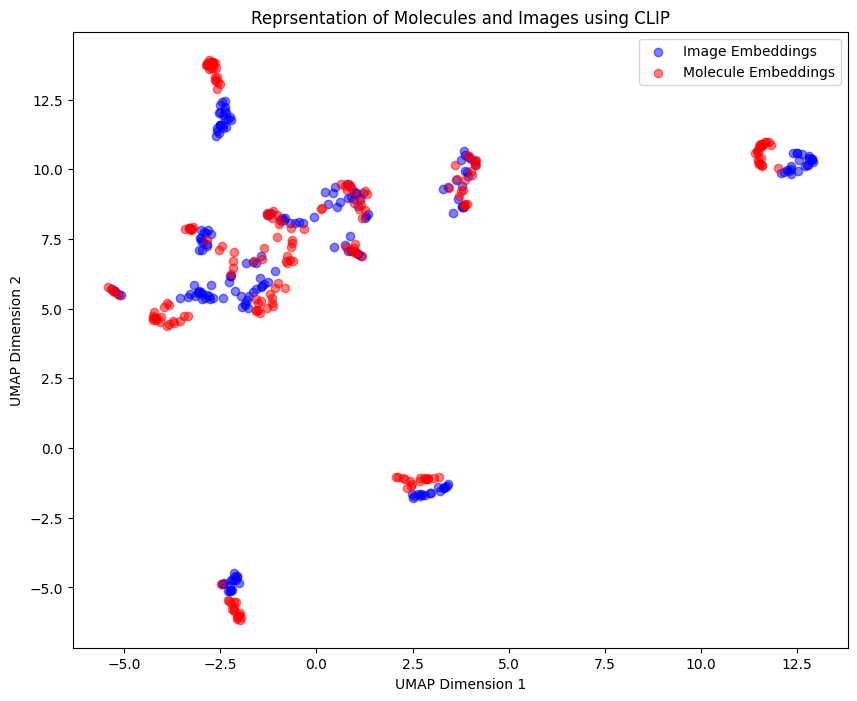

In [71]:
import umap
import matplotlib.pyplot as plt
import numpy as np

# Assuming val_img_features and val_text_features are PyTorch tensors
val_img_features_np = img_features_normed.cpu().numpy()
val_text_features_np = text_features_normed.cpu().numpy()

# Combine the features
combined_features = np.concatenate((val_img_features_np, val_text_features_np), axis=0)

# Create labels for coloring
labels = np.array([0] * val_img_features_np.shape[0] + [1] * val_text_features_np.shape[0])

# Fit UMAP
reducer = umap.UMAP()
embedding = reducer.fit_transform(combined_features)

# Plot the UMAP
plt.figure(figsize=(10, 8))
plt.scatter(embedding[labels == 0, 0], embedding[labels == 0, 1], c='blue', label='Image Embeddings', alpha=0.5)
plt.scatter(embedding[labels == 1, 0], embedding[labels == 1, 1], c='red', label='Molecule Embeddings', alpha=0.5)
plt.legend()
plt.title('Reprsentation of Molecules and Images using CLIP')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.savefig("clip_umap.png", dpi=300)
plt.show()

### Generation

In [72]:
# from test set take molecules, obtain their clip embeddings
# use these embeddings to generate images using the decoder
# compare generated images with the ground truth images

# maybe also see what kind of images are generated when image clip embeddings are used instead of molecules? -- proof of concept

In [73]:
from models.unet_decoder.model import UNetDiffusionDecoder
import yaml

In [74]:
decoder_chkpt = "../checkpoints/unet_decoder/decoder_first_run/best_val.pt"
decoder_config = "../checkpoints/unet_decoder/decoder_first_run/config.yaml"

In [75]:
with open(decoder_config, 'r') as f:
    config_file = yaml.safe_load(f)

In [76]:
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")

In [77]:
decoder_model = UNetDiffusionDecoder(
        latent_dim=config_file['latent_dim'],
        output_channels=config_file['output_channels']
    ).to(device)

In [90]:
def generate_images(mol_embeddings,
                    decoder_model_checkpoint, decoder_model):
    
    # initiate model using it's config
    decoder_model.load_state_dict(torch.load(decoder_model_checkpoint)["state_dict"])
    
    
    # use mol_embeddings to generate images
    decoder_model.eval()
    generate_images = []
    with torch.no_grad():
        for mol_embedding in mol_embeddings:
            mol_embedding = mol_embedding.unsqueeze(0)
            generated_image = decoder_model(mol_embedding)
            generate_images.append(generated_image)

    return torch.cat(generate_images)

In [104]:
generated_images = generate_images(mol_embeddings=img_features, 
                                          decoder_model_checkpoint=decoder_chkpt,
                                          decoder_model=decoder_model)

In [105]:
generated_images.size()

torch.Size([200, 5, 520, 696])

In [106]:
truth_images.size(), generated_images.size()

(torch.Size([200, 5, 520, 696]), torch.Size([200, 5, 520, 696]))

In [107]:
generated_images[0]

tensor([[[202.6734, 202.6734, 202.6734,  ..., 221.2726, 221.2726, 221.2726],
         [202.6734, 202.6734, 202.6734,  ..., 221.2726, 221.2726, 221.2726],
         [202.6734, 202.6734, 202.6734,  ..., 221.2726, 221.2726, 221.2726],
         ...,
         [221.4773, 221.4773, 221.4773,  ..., 218.8452, 218.8452, 218.8452],
         [221.4773, 221.4773, 221.4773,  ..., 218.8452, 218.8452, 218.8452],
         [221.4773, 221.4773, 221.4773,  ..., 218.8452, 218.8452, 218.8452]],

        [[174.0606, 174.0606, 174.0606,  ..., 185.7718, 185.7718, 185.7718],
         [174.0606, 174.0606, 174.0606,  ..., 185.7718, 185.7718, 185.7718],
         [174.0606, 174.0606, 174.0606,  ..., 185.7718, 185.7718, 185.7718],
         ...,
         [196.6739, 196.6739, 196.6739,  ..., 198.9101, 198.9101, 198.9101],
         [196.6739, 196.6739, 196.6739,  ..., 198.9101, 198.9101, 198.9101],
         [196.6739, 196.6739, 196.6739,  ..., 198.9101, 198.9101, 198.9101]],

        [[203.1160, 203.1160, 203.1160,  ...

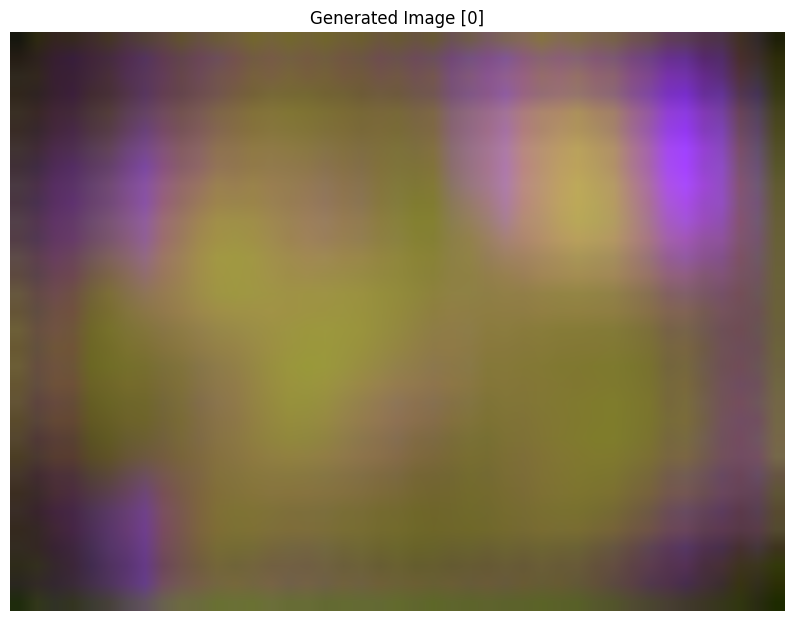

In [108]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming generated_images is a tensor of shape (200, 5, 520, 696)

# Function to convert 5-channel image to RGB using channels 0, 3, and 4
def convert_to_rgb(image):
    return np.stack([image[0], image[3], image[4]], axis=-1)

# Convert the first generated image to RGB
gen_rgb = convert_to_rgb(generated_images[0].cpu().numpy())

# Normalize the image to the range [0, 1]
gen_rgb = (gen_rgb - gen_rgb.min()) / (gen_rgb.max() - gen_rgb.min())

# Plot the image
plt.figure(figsize=(10, 10))
plt.imshow(gen_rgb)
plt.title("Generated Image [0]")
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

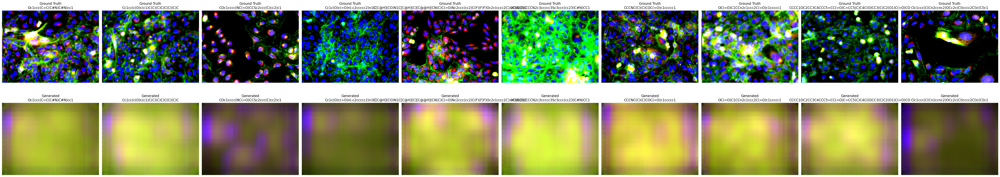

In [110]:
# Extract the corresponding images and SMILES strings
import matplotlib.pyplot as plt
import numpy as np
import random

# Extract the corresponding images and SMILES strings
random_indices = random.sample(range(200), 10)

selected_generated_images = generated_images[random_indices]
selected_ground_truth_images = truth_images[random_indices]
selected_smiles = [all_smiles[i] for i in random_indices]

# Function to convert 5-channel image to RGB using channels 0, 3, and 4
def convert_to_rgb(image):
    return np.stack([image[0], image[3], image[4]], axis=-1)

# Plot the images in a grid
fig, axes = plt.subplots(2, 10, figsize=(50, 10))

for i, idx in enumerate(random_indices):
    # Convert images to RGB
    gt_rgb = convert_to_rgb(selected_ground_truth_images[i].cpu().numpy())
    gen_rgb = convert_to_rgb(selected_generated_images[i].cpu().numpy())
    
    # Normalize the generated image to the range [0, 1]
    gen_rgb = (gen_rgb - gen_rgb.min()) / (gen_rgb.max() - gen_rgb.min())
    
    # Plot ground truth image
    axes[0, i].imshow(gt_rgb)
    axes[0, i].set_title(f"Ground Truth\n{selected_smiles[i]}")
    axes[0, i].axis('off')
    
    # Plot generated image
    axes[1, i].imshow(gen_rgb)
    axes[1, i].set_title(f"Generated\n{selected_smiles[i]}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

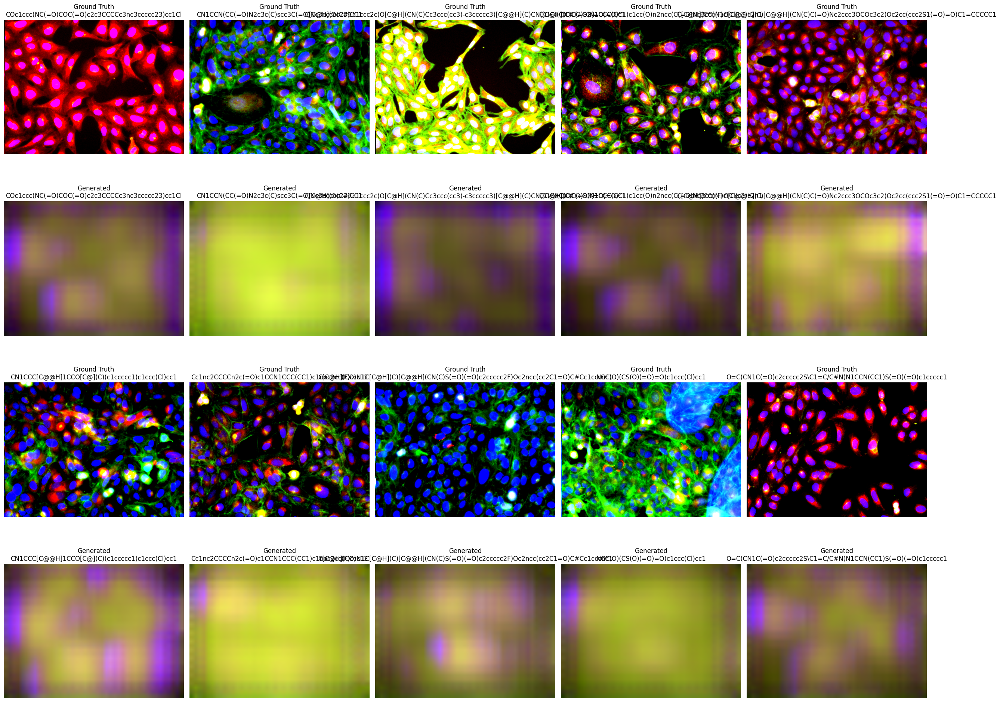

In [113]:
# Extract the corresponding images and SMILES strings
import matplotlib.pyplot as plt
import numpy as np
import random

# Extract the corresponding images and SMILES strings
random_indices = random.sample(range(200), 20)

selected_generated_images = generated_images[random_indices]
selected_ground_truth_images = truth_images[random_indices]
selected_smiles = [all_smiles[i] for i in random_indices]

# Function to convert 5-channel image to RGB using channels 0, 3, and 4
def convert_to_rgb(image):
    return np.stack([image[0], image[3], image[4]], axis=-1)

# Plot the images in a grid
fig, axes = plt.subplots(4, 5, figsize=(25, 20))

for i in range(5):
    # Convert images to RGB
    gt_rgb_1 = convert_to_rgb(selected_ground_truth_images[i].cpu().numpy())
    gen_rgb_1 = convert_to_rgb(selected_generated_images[i].cpu().numpy())
    gt_rgb_2 = convert_to_rgb(selected_ground_truth_images[i + 5].cpu().numpy())
    gen_rgb_2 = convert_to_rgb(selected_generated_images[i + 5].cpu().numpy())
    
    # Normalize the generated images to the range [0, 1]
    gen_rgb_1 = (gen_rgb_1 - gen_rgb_1.min()) / (gen_rgb_1.max() - gen_rgb_1.min())
    gen_rgb_2 = (gen_rgb_2 - gen_rgb_2.min()) / (gen_rgb_2.max() - gen_rgb_2.min())
    
    # Plot first set of ground truth images
    axes[0, i].imshow(gt_rgb_1)
    axes[0, i].set_title(f"Ground Truth\n{selected_smiles[i]}")
    axes[0, i].axis('off')
    
    # Plot first set of generated images
    axes[1, i].imshow(gen_rgb_1)
    axes[1, i].set_title(f"Generated\n{selected_smiles[i]}")
    axes[1, i].axis('off')
    
    # Plot second set of ground truth images
    axes[2, i].imshow(gt_rgb_2)
    axes[2, i].set_title(f"Ground Truth\n{selected_smiles[i + 5]}")
    axes[2, i].axis('off')
    
    # Plot second set of generated images
    axes[3, i].imshow(gen_rgb_2)
    axes[3, i].set_title(f"Generated\n{selected_smiles[i + 5]}")
    axes[3, i].axis('off')

plt.savefig('generated_images.png', dpi=300)
plt.tight_layout()
plt.show()

### Scratch Cells

In [17]:
# morgan fingerprints of molecules corresponding to inchikeys
molecule_df = pd.read_hdf('../data/mhn_fingerprints.hdf5')

In [18]:
print(molecule_df.shape)
molecule_df.head()

(30404, 8192)


,0,1,2,3,4,5,6,7,8,9,...,8182,8183,8184,8185,8186,8187,8188,8189,8190,8191
GZDPKZCGLLNMKC-HFMPRLQTSA-N,2.772589,1.098612,1.945910,0.693147,2.564949,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,1.098612,1.098612,0.693147,0.0,0.0,0.0,0.000000,0.0,0.0
RZKDUVXCVDUJNN-CEYNDMKZSA-N,3.135494,1.386294,1.386294,0.693147,1.945910,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,0.000000,1.098612,0.693147,0.0,0.0,0.0,0.000000,0.0,0.0
ZXNVTQNRWSYAMZ-UHFFFAOYSA-N,0.693147,0.693147,1.098612,0.693147,2.484907,1.098612,0.693147,0.0,0.693147,0.0,...,0.0,0.000000,1.386294,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
UBJVSEFSDIKCAH-UHFFFAOYSA-N,2.397895,1.098612,1.386294,0.000000,2.944439,0.000000,0.000000,0.0,0.000000,0.0,...,0.0,1.609438,0.693147,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
MESWQEBVROHANN-XQBPLPMBSA-N,2.944439,0.000000,1.386294,0.693147,2.197225,0.000000,1.386294,0.0,0.000000,0.0,...,0.0,0.000000,1.098612,0.693147,0.0,0.0,0.0,0.693147,0.0,0.0


In [20]:
sample_index = pd.read_csv(val, sep=",", header=0)
sample_index.set_index(['SAMPLE_KEY'])
sample_keys = sample_index['SAMPLE_KEY'].tolist()
sample_index

,Unnamed: 0,SAMPLE_KEY,BROAD_ID,PLATE_ID,WELL_POSITION,SITE,SAMPLE_ID,CPD_NAME,CPD_NAME_TYPE,SMILES,INCHIKEY,IMG_ERSyto,IMG_ERSytoBleed,IMG_Hoechst,IMG_Mito,IMG_Ph_golgi,IMG_CNT_CELLS,ROW_NR_LABEL_MAT
0,24208,25581-B14-2,BRD-K09658832-001-06-2,25581,B14,2,SA1861489,BRD-K09658832,BROAD_CPD_ID,COc1ccc(cc1)C(=O)Cn1nnc(n1)-c1cccs1,AAGGUCRASUJPPN-UHFFFAOYSA-N,cdp2w11_b14_s2_w257943f3f-f052-48ab-b01c-2505a...,cdp2w11_b14_s2_w36b341626-96d9-48c0-a116-0b4c3...,cdp2w11_b14_s2_w15d7fc073-3140-419f-8e0b-2cf3f...,cdp2w11_b14_s2_w5cc6168ce-70c3-4cf6-acbf-63593...,cdp2w11_b14_s2_w4efe28780-5737-4d5b-8ef4-ded3f...,80,8998
1,10335,25376-O03-1,BRD-K14836228-001-05-1,25376,O03,1,SA1860534,BRD-K14836228,BROAD_CPD_ID,CN(C)C(=O)Oc1c(C)cc(cc1C)C(=O)CS(=O)(=O)c1ccccc1,AAHUMVOTCJGEFN-UHFFFAOYSA-N,cdp2w10_o03_s1_w20affe877-dfa1-4f42-8ad9-909ca...,cdp2w10_o03_s1_w329c56bad-418f-4aca-9a52-3b8e4...,cdp2w10_o03_s1_w164aa7d8f-bb14-4681-ac8c-629da...,cdp2w10_o03_s1_w55b6d684d-36e6-4504-b610-a8ed4...,cdp2w10_o03_s1_w4e629a2ed-2d50-43db-bbec-2e656...,51,7317
2,5425,24312-I13-2,BRD-K51215422-001-02-3,24312,I13,2,SA82162,A-3,common,NCCNS(=O)(=O)c1cccc2c(Cl)cccc12,ACIMRXKJKQGBGL-UHFFFAOYSA-N,cdp2bioactives_i13_s2_w25c86b312-94aa-4d9d-a10...,cdp2bioactives_i13_s2_w3d367f700-699a-4f8d-a85...,cdp2bioactives_i13_s2_w1a14380e2-e832-496c-833...,cdp2bioactives_i13_s2_w5bf51f2ed-0394-440f-aca...,cdp2bioactives_i13_s2_w4f9a6a03e-964d-45f4-87a...,138,1004
3,18657,25492-L03-1,BRD-K86410548-001-05-1,25492,L03,1,SA1859902,BRD-K86410548,BROAD_CPD_ID,Clc1ccc(COc2ccc(cc2)-c2nc(C#N)c(o2)N2CCOCC2)cc1,ACLJMBVYCCDWSD-UHFFFAOYSA-N,cdp2w10-au00024360_l03_s1_w2f4339d5a-9e70-4468...,cdp2w10-au00024360_l03_s1_w395fa5128-bf84-4696...,cdp2w10-au00024360_l03_s1_w11bffd3a0-bcf7-4066...,cdp2w10-au00024360_l03_s1_w5fac0d576-84c2-4fcd...,cdp2w10-au00024360_l03_s1_w464ff5478-0faf-4784...,51,4128
4,16706,25435-N15-6,BRD-K55763533-001-05-7,25435,N15,6,SA1854847,BRD-K55763533,BROAD_CPD_ID,Cc1cccc(NNC(=O)C2CCC2)c1,ACTRZKFUNCFTJE-UHFFFAOYSA-N,cdp2w10_n15_s6_w2c28d4ccf-0ce4-4256-b776-f92ea...,cdp2w10_n15_s6_w3276bb77d-2c68-4fb9-901f-47637...,cdp2w10_n15_s6_w16fc3c0f9-464a-4c2e-91b7-97713...,cdp2w10_n15_s6_w5b1dd2140-fb6c-4323-ac2b-6821c...,cdp2w10_n15_s6_w4188e7799-2bf5-4266-8568-fef75...,76,5349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2110,22097,25572-H04-3,BRD-K38205896-001-05-2,25572,H04,3,SA1862216,BRD-K38205896,BROAD_CPD_ID,CCOC(=O)N1CCN(CC1)C(=O)COc1ccc2OC3(CCN(CC3)C(C...,ZYELQBWNTCMLJF-UHFFFAOYSA-N,cdp2w11_h04_s3_w2289b5843-a95a-40fc-9015-fd049...,cdp2w11_h04_s3_w3534533e4-ce0c-4ddb-b44e-8af45...,cdp2w11_h04_s3_w1d37610a9-4b60-4935-9381-9131f...,cdp2w11_h04_s3_w5f7e49845-dbc8-4d23-95c7-0f753...,cdp2w11_h04_s3_w421db0d52-813d-4f40-89dd-c7679...,83,3328
2111,27590,25598-E09-6,BRD-K18000429-001-05-7,25598,E09,6,SA1859239,BRD-K18000429,BROAD_CPD_ID,Brc1ccccc1OCc1ccc(cc1)C(=O)N1CCCCC1,ZZLYSPCQPXRIKW-UHFFFAOYSA-N,cdp2w11_e09_s6_w27bfc44ef-d0b2-45d2-b568-aab75...,cdp2w11_e09_s6_w30f4a6ff4-7435-4c36-9624-797ce...,cdp2w11_e09_s6_w110e28e97-48c3-403d-b8e5-880ed...,cdp2w11_e09_s6_w542f5dddc-af9a-4e89-910d-7aa63...,cdp2w11_e09_s6_w4161db930-1836-48c7-aa6a-51fc6...,59,5954
2112,17089,25438-A12-5,BRD-A65735348-001-06-8,25438,A12,5,SA1861353,BRD-A65735348,BROAD_CPD_ID,COc1ccc(N=C(S)NC(NC(=O)c2cccc(Cl)c2)C(Cl)(Cl)C...,ZZNOGSGZWQWJEL-UHFFFAOYSA-N,cdp2w10_a12_s5_w295e647b9-a4ba-479d-82d4-d20e8...,cdp2w10_a12_s5_w3e789ba6d-80f6-46ed-8ca1-e284c...,cdp2w10_a12_s5_w1546c0f81-9f9e-42de-bc93-39279...,cdp2w10_a12_s5_w50f5cbc4a-7921-4117-afa8-1112d...,cdp2w10_a12_s5_w49771f841-f339-4bd5-83b8-6d66e...,68,1756
2113,45216,25991-J24-4,BRD-K71125014-001-03-2,25991,J24,4,SA39659,sulfadimethoxine,INN,COc1cc(NS(=O)(=O)c2ccc(N)cc2)nc(OC)n1,ZZORFUFYDOWNEF-UHFFFAOYSA-N,cdp2w8x2_j24_s4_w283bc27ed-3128-497a-af64-5dbd...,cdp2w8x2_j24_s4_w320595b65-d3d8-4752-a82a-11df...,cdp2w8x2_j24_s4_w12523665f-8286-4bff-9c69-a9d8...,cdp2w8x2_j24_s4_w57aef438a-b16e-49ff-b8ca-713e...,cdp2w8x2_j24_s4_w4837d2118-fb

In [21]:
molecule_df['fingerprints'] = molecule_df.values.tolist()
molecule_df.head()

,0,1,2,3,4,5,6,7,8,9,...,8183,8184,8185,8186,8187,8188,8189,8190,8191,fingerprints
GZDPKZCGLLNMKC-HFMPRLQTSA-N,2.772589,1.098612,1.945910,0.693147,2.564949,0.000000,0.000000,0.0,0.000000,0.0,...,1.098612,1.098612,0.693147,0.0,0.0,0.0,0.000000,0.0,0.0,"[2.772588722239781, 1.0986122886681098, 1.9459..."
RZKDUVXCVDUJNN-CEYNDMKZSA-N,3.135494,1.386294,1.386294,0.693147,1.945910,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,1.098612,0.693147,0.0,0.0,0.0,0.000000,0.0,0.0,"[3.1354942159291497, 1.3862943611198906, 1.386..."
ZXNVTQNRWSYAMZ-UHFFFAOYSA-N,0.693147,0.693147,1.098612,0.693147,2.484907,1.098612,0.693147,0.0,0.693147,0.0,...,0.000000,1.386294,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,"[0.6931471805599453, 0.6931471805599453, 1.098..."
UBJVSEFSDIKCAH-UHFFFAOYSA-N,2.397895,1.098612,1.386294,0.000000,2.944439,0.000000,0.000000,0.0,0.000000,0.0,...,1.609438,0.693147,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,"[2.3978952727983707, 1.0986122886681098, 1.386..."
MESWQEBVROHANN-XQBPLPMBSA-N,2.944439,0.000000,1.386294,0.693147,2.197225,0.000000,1.386294,0.0,0.000000,0.0,...,0.000000,1.098612,0.693147,0.0,0.0,0.0,0.693147,0.0,0.0,"[2.9444389791664403, 0.0, 1.3862943611198906, ..."


In [22]:
molecule_df = molecule_df[["fingerprints"]]

In [23]:
molecule_df

,fingerprints
GZDPKZCGLLNMKC-HFMPRLQTSA-N,"[2.772588722239781, 1.0986122886681098, 1.9459..."
RZKDUVXCVDUJNN-CEYNDMKZSA-N,"[3.1354942159291497, 1.3862943611198906, 1.386..."
ZXNVTQNRWSYAMZ-UHFFFAOYSA-N,"[0.6931471805599453, 0.6931471805599453, 1.098..."
UBJVSEFSDIKCAH-UHFFFAOYSA-N,"[2.3978952727983707, 1.0986122886681098, 1.386..."
MESWQEBVROHANN-XQBPLPMBSA-N,"[2.9444389791664403, 0.0, 1.3862943611198906, ..."
...,...
NKTJXKSVVDCPJP-UHFFFAOYSA-N,"[1.6094379124341003, 0.0, 1.0986122886681098, ..."
ATSHBJSURJRITP-UHFFFAOYSA-N,"[2.1972245773362196, 0.0, 1.3862943611198906, ..."
OVTRWWAFZIYZGF-UHFFFAOYSA-N,"[2.0794415416798357, 0.6931471805599453, 2.079..."
OQTKGYZKQDDSHB-UHFFFAOYSA-N,"[1.6094379124341003, 0.6931471805599453, 0.693..."


In [24]:
fingerprints_dict = molecule_df["fingerprints"].to_dict()
len(fingerprints_dict)

30404

In [26]:
train_df = pd.read_pickle("../data/train_df.pkl")
val_df = pd.read_pickle("../data/val_df.pkl")
test_df = pd.read_pickle("../data/test_df.pkl")

In [27]:
# Function to add fingerprints column to a dataframe
def add_fingerprints_column(df, fingerprints_dict):
    df['fingerprints'] = df['INCHIKEY'].map(fingerprints_dict)
    return df

In [28]:
# Add the fingerprints column to val_df, train_df, and test_df
val_df = add_fingerprints_column(val_df, fingerprints_dict)
train_df = add_fingerprints_column(train_df, fingerprints_dict)
test_df = add_fingerprints_column(test_df, fingerprints_dict)

In [30]:
train_df.to_pickle("../data/train_df.pkl")
val_df.to_pickle("../data/val_df.pkl")
test_df.to_pickle("../data/test_df.pkl")

In [16]:
sample_index = pd.merge(left=sample_index, left_on="INCHIKEY", right_index=True, right=molecule_df, how="left")

In [18]:
# Get the list of columns
cols = list(sample_index.columns)

# Remove 'fingerprints' from its current position
cols.remove('fingerprints')

# Find the position of 'INCHIKEY' and insert 'fingerprints' right after it
inchi_index = cols.index('INCHIKEY')
cols.insert(inchi_index + 1, 'fingerprints')

# Reorder the DataFrame
sample_index = sample_index[cols]

In [20]:
sample_index.to_pickle("../data/cellpainting-split-test-imgpermol.pkl")

In [21]:
sample_index

,Unnamed: 0,SAMPLE_KEY,BROAD_ID,PLATE_ID,WELL_POSITION,SITE,SAMPLE_ID,CPD_NAME,CPD_NAME_TYPE,SMILES,INCHIKEY,fingerprints,IMG_ERSyto,IMG_ERSytoBleed,IMG_Hoechst,IMG_Mito,IMG_Ph_golgi,IMG_CNT_CELLS,ROW_NR_LABEL_MAT
0,24208,25581-B14-2,BRD-K09658832-001-06-2,25581,B14,2,SA1861489,BRD-K09658832,BROAD_CPD_ID,COc1ccc(cc1)C(=O)Cn1nnc(n1)-c1cccs1,AAGGUCRASUJPPN-UHFFFAOYSA-N,"[1.3862943611198906, 0.0, 1.0986122886681098, ...",cdp2w11_b14_s2_w257943f3f-f052-48ab-b01c-2505a...,cdp2w11_b14_s2_w36b341626-96d9-48c0-a116-0b4c3...,cdp2w11_b14_s2_w15d7fc073-3140-419f-8e0b-2cf3f...,cdp2w11_b14_s2_w5cc6168ce-70c3-4cf6-acbf-63593...,cdp2w11_b14_s2_w4efe28780-5737-4d5b-8ef4-ded3f...,80,8998
1,10335,25376-O03-1,BRD-K14836228-001-05-1,25376,O03,1,SA1860534,BRD-K14836228,BROAD_CPD_ID,CN(C)C(=O)Oc1c(C)cc(cc1C)C(=O)CS(=O)(=O)c1ccccc1,AAHUMVOTCJGEFN-UHFFFAOYSA-N,"[2.302585092994046, 0.0, 1.791759469228055, 0....",cdp2w10_o03_s1_w20affe877-dfa1-4f42-8ad9-909ca...,cdp2w10_o03_s1_w329c56bad-418f-4aca-9a52-3b8e4...,cdp2w10_o03_s1_w164aa7d8f-bb14-4681-ac8c-629da...,cdp2w10_o03_s1_w55b6d684d-36e6-4504-b610-a8ed4...,cdp2w10_o03_s1_w4e629a2ed-2d50-43db-bbec-2e656...,51,7317
2,5425,24312-I13-2,BRD-K51215422-001-02-3,24312,I13,2,SA82162,A-3,common,NCCNS(=O)(=O)c1cccc2c(Cl)cccc12,ACIMRXKJKQGBGL-UHFFFAOYSA-N,"[1.3862943611198906, 0.6931471805599453, 1.098...",cdp2bioactives_i13_s2_w25c86b312-94aa-4d9d-a10...,cdp2bioactives_i13_s2_w3d367f700-699a-4f8d-a85...,cdp2bioactives_i13_s2_w1a14380e2-e832-496c-833...,cdp2bioactives_i13_s2_w5bf51f2ed-0394-440f-aca...,cdp2bioactives_i13_s2_w4f9a6a03e-964d-45f4-87a...,138,1004
3,18657,25492-L03-1,BRD-K86410548-001-05-1,25492,L03,1,SA1859902,BRD-K86410548,BROAD_CPD_ID,Clc1ccc(COc2ccc(cc2)-c2nc(C#N)c(o2)N2CCOCC2)cc1,ACLJMBVYCCDWSD-UHFFFAOYSA-N,"[1.9459101490553132, 0.0, 1.6094379124341003, ...",cdp2w10-au00024360_l03_s1_w2f4339d5a-9e70-4468...,cdp2w10-au00024360_l03_s1_w395fa5128-bf84-4696...,cdp2w10-au00024360_l03_s1_w11bffd3a0-bcf7-4066...,cdp2w10-au00024360_l03_s1_w5fac0d576-84c2-4fcd...,cdp2w10-au00024360_l03_s1_w464ff5478-0faf-4784...,51,4128
4,16706,25435-N15-6,BRD-K55763533-001-05-7,25435,N15,6,SA1854847,BRD-K55763533,BROAD_CPD_ID,Cc1cccc(NNC(=O)C2CCC2)c1,ACTRZKFUNCFTJE-UHFFFAOYSA-N,"[1.9459101490553132, 0.6931471805599453, 0.693...",cdp2w10_n15_s6_w2c28d4ccf-0ce4-4256-b776-f92ea...,cdp2w10_n15_s6_w3276bb77d-2c68-4fb9-901f-47637...,cdp2w10_n15_s6_w16fc3c0f9-464a-4c2e-91b7-97713...,cdp2w10_n15_s6_w5b1dd2140-fb6c-4323-ac2b-6821c...,cdp2w10_n15_s6_w4188e7799-2bf5-4266-8568-fef75...,76,5349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2110,22097,25572-H04-3,BRD-K38205896-001-05-2,25572,H04,3,SA1862216,BRD-K38205896,BROAD_CPD_ID,CCOC(=O)N1CCN(CC1)C(=O)COc1ccc2OC3(CCN(CC3)C(C...,ZYELQBWNTCMLJF-UHFFFAOYSA-N,"[3.091042453358316, 0.0, 2.0794415416798357, 0...",cdp2w11_h04_s3_w2289b5843-a95a-40fc-9015-fd049...,cdp2w11_h04_s3_w3534533e4-ce0c-4ddb-b44e-8af45...,cdp2w11_h04_s3_w1d37610a9-4b60-4935-9381-9131f...,cdp2w11_h04_s3_w5f7e49845-dbc8-4d23-95c7-0f753...,cdp2w11_h04_s3_w421db0d52-813d-4f40-89dd-c7679...,83,3328
2111,27590,25598-E09-6,BRD-K18000429-001-05-7,25598,E09,6,SA1859239,BRD-K18000429,BROAD_CPD_ID,Brc1ccccc1OCc1ccc(cc1)C(=O)N1CCCCC1,ZZLYSPCQPXRIKW-UHFFFAOYSA-N,"[2.1972245773362196, 1.0986122886681098, 1.098...",cdp2w11_e09_s6_w27bfc44ef-d0b2-45d2-b568-aab75...,cdp2w11_e09_s6_w30f4a6ff4-7435-4c36-9624-797ce...,cdp2w11_e09_s6_w110e28e97-48c3-403d-b8e5-880ed...,cdp2w11_e09_s6_w542f5dddc-af9a-4e89-910d-7aa63...,cdp2w11_e09_s6_w4161db930-1836-48c7-aa6a-51fc6...,59,5954
2112,17089,25438-A12-5,BRD-A65735348-001-06-8,25438,A12,5,SA1861353,BRD-A65735348,BROAD_CPD_ID,COc1ccc(N=C(S)NC(NC(=O)c2cccc(Cl)c2)C(Cl)(Cl)C...,ZZNOGSGZWQWJEL-UHFFFAOYSA-N,"[1.791759469228055, 1.6094379124341003, 1.7917...",cdp2w10_a12_s5_w295e647b9-a4ba-479d-82d4-d20e8...,cdp2w10_a12_s5_w3e789ba6d-80f6-46ed-8ca1-e284c...,cdp2w10_a12_s5_w1546c0f81-9f9e-42de-bc93-39279...,cdp2w10_a12_s5_w50f5cbc4a-7921-4117-afa8-1112d...,cdp2w10

In [8]:
molset = set(molecule_df.index.values)
imgset = set(sample_index["INCHIKEY"].values)
print(len(imgset), len(molset), len(molset.intersection(imgset)))

2115 30404 2115


In [16]:
np.array(molecule_df.values.tolist()).shape

In [12]:
val_df = pd.read_pickle("../data/val_df.pkl")
val_df

,image_id,INCHIKEY,SMILES,0,1,2,3,4,5,6,...,502,503,504,505,506,507,508,509,510,511
0,24277-A23-1,UJYGDMFEEDNVBF-OGGGUQDZSA-N,CC(C)[C@@H]1N2C(=O)[C@](NC(=O)[C@H]3CN(C)[C@@H...,-0.032937,0.017564,0.011897,0.101636,-0.011638,0.008633,0.030070,...,0.003299,-0.027838,0.113920,0.005392,-0.077080,0.023329,-0.032510,-0.027259,-0.041918,0.026195
1,24277-A23-2,UJYGDMFEEDNVBF-OGGGUQDZSA-N,CC(C)[C@@H]1N2C(=O)[C@](NC(=O)[C@H]3CN(C)[C@@H...,-0.042179,0.037372,-0.013857,0.075796,-0.003739,0.011088,0.047827,...,0.034652,-0.036308,0.144922,-0.000260,-0.108879,0.026481,-0.011613,-0.016930,-0.010634,0.047661
2,24277-A23-3,UJYGDMFEEDNVBF-OGGGUQDZSA-N,CC(C)[C@@H]1N2C(=O)[C@](NC(=O)[C@H]3CN(C)[C@@H...,-0.040597,0.055374,-0.010088,0.061922,0.000483,0.008428,0.028094,...,0.023185,-0.030996,0.147373,-0.011828,-0.102474,0.011488,-0.010484,-0.015396,0.002707,0.066515
3,24277-A23-4,UJYGDMFEEDNVBF-OGGGUQDZSA-N,CC(C)[C@@H]1N2C(=O)[C@](NC(=O)[C@H]3CN(C)[C@@H...,-0.030869,0.022982,-0.004174,0.068748,0.003554,0.013498,0.035332,...,0.033317,-0.038987,0.126131,0.011095,-0.088292,0.022146,-0.011146,-0.033127,-0.012218,0.029981
4,24277-A23-5,UJYGDMFEEDNVBF-OGGGUQDZSA-N,CC(C)[C@@H]1N2C(=O)[C@](NC(=O)[C@H]3CN(C)[C@@H...,-0.032579,0.030376,-0.009915,0.076301,0.001442,0.008287,0.032955,...,0.028803,-0.039590,0.140242,0.008090,-0.100706,0.023302,-0.005579,-0.027091,-0.008500,0.034899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4254,24623-L06-5,PCKDIUISIKHUJW-CEYNDMKZSA-N,C[C@H](CO)N1C[C@H](C)[C@H](CN(C)CC2CC2)Oc2cc(c...,0.015950,0.043044,-0.012592,-0.022845,-0.053193,0.076969,0.011287,...,-0.022228,0.032970,0.001749,0.029482,0.003062,0.008008,-0.013808,0.029482,-0.021197,0.032596
4255,24623-L06-6,PCKDIUISIKHUJW-CEYNDMKZSA-N,C[C@H](CO)N1C[C@H](C)[C@H](CN(C)CC2CC2)Oc2cc(c...,0.004359,0.036414,-0.002023,0.000754,-0.052280,0.074286,0.009227,...,-0.019304,0.013615,0.002037,0.022434,0.003846,0.024414,-0.009433,0.017500,-0.021405,0.045355
4256,24623-M21-1,QUERDMQYNZTGQF-WZOHSFFVSA-N,C[C@H](CO)N1C[C@H](C)[C@@H](CN(C)S(=O)(=O)c2cc...,-0.041366,0.040553,-0.045276,0.019486,-0.024697,0.067520,-0.021817,...,-0.004811,-0.004962,-0.014130,-0.037511,-0.010914,-0.012201,0.022707,-0.047713,-0.031131,0.062315
4257,24623-M21-2,QUERDMQYNZTGQF-WZOHSFFVSA-N,C[C@H](CO)N1C[C@H](C)[C@@H](CN(C)S(=O)(=O)c2cc...,-0.050575,0.047081,-0.044520,0.020375,-0.000909,0.063296,-0.012338,...,0.001623,-0.007468,0.000240,-0.040795,-0.025738,-0.013360,0.024114,-0.047750,-0.048003,0.068387


In [13]:
val_df.INCHIKEY.nunique()

200

In [5]:
ds = CellPainting2("../data/val_df.pkl", img_path,preprocess_val)

In [6]:
batch = next(iter(DataLoader(ds, batch_size=5, shuffle=False)))

In [7]:
batch.keys()

dict_keys(['image', 'molecule_fp'])

In [5]:
val = CellPainting2(val,
                       img_path,
                       mol_path,
                       transforms = preprocess_val)

TypeError: CellPainting2.__init__() got multiple values for argument 'transforms'

In [11]:
batch = next(iter(DataLoader(CellPainting2)))

TypeError: object of type 'type' has no len()